# Candidate routing + signed attack path

Этот ноутбук реализует два этапа исследования механизма adversarial patch:

1. **Candidate tracing:** как clean target, patched target и глобальный post-NMS winner перемещаются между ячейками и уровнями P3/P4/P5.
2. **Clean → patched attack path:** signed причинное разложение изменения фиксированного pre-NMS score на полном входе Detect.

Главное отличие от предыдущих экспериментов: мы больше не пытаемся объяснить глобальный post-NMS результат картой важности одной clean-ячейки. Сначала раскладываем дискретный routing, затем точно объясняем непрерывное изменение выбранных candidate scores.

Ноутбук не копирует изображения и не сохраняет полные feature tensors. По умолчанию действует жёсткий лимит **8 GiB** на новую папку результатов; вместе с существующим историческим кэшем (~11 GiB) это сохраняет общий анализ ниже 20 GiB.

Smoke-проверка пройдена. Текущая конфигурация запускает полный candidate tracing и стратифицированный attack-path анализ на 200 примерах.

In [1]:
from pathlib import Path
import sys
import json
import sqlite3
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, Markdown

cwd = Path.cwd().resolve()
REPO_ROOT = next((p for p in [cwd, *cwd.parents] if (p / "new_experiments").exists()), None)
if REPO_ROOT is None:
    raise RuntimeError("Run the notebook from inside PatchSuccessResearch.")
for p in (REPO_ROOT, REPO_ROOT / "new_experiments"):
    if str(p) not in sys.path:
        sys.path.insert(0, str(p))

from CandidateRoutingAndAttackPath import load_experiment, output_size_gb
from CandidateRoutingAndAttackPath.common import directory_size_bytes
from CandidateRoutingAndAttackPath.candidate_routing import (
    CandidateTraceConfig,
    load_trace_tables,
    load_example_candidates,
    run_candidate_tracing,
)
from CandidateRoutingAndAttackPath.attack_path import (
    AttackPathConfig,
    load_attack_path_tables,
    run_attack_path_decomposition,
)
from CandidateRoutingAndAttackPath.plots import (
    plot_attack_path_by_mode,
    plot_attack_path_example,
    plot_attack_path_overview,
    plot_candidate_example,
    plot_candidate_overview,
    plot_candidate_rank_profiles,
    select_visual_example_ids,
)

pd.set_option("display.max_columns", 100)
pd.set_option("display.max_rows", 100)
plt.rcParams["figure.dpi"] = 110
print("repo:", REPO_ROOT)

repo: /Users/ashentide/PycharmProjects/PatchSuccessResearch


## Конфигурация

`None` в `TRACE_MAX_EXAMPLES` означает весь существующий attack-cache (6000 примеров). Параметры ниже уже переведены со smoke на основной запуск.

In [2]:
OUTPUT_DIR = REPO_ROOT / "CandidateRoutingAndAttackPath" / "outputs"
DISK_LIMIT_GB = 8.0

# Full Stage 1: all 6000 cached examples.
TRACE_MAX_EXAMPLES = None
TRACE_BATCH_SIZE = 8  # reduce to 2-4 only if the accelerator runs out of memory
TRACE_TOP_K = 50
TRACE_LINEAGE_TOP_K = 20

# Stratified real comparison across success × routing mode.
PATH_MAX_EXAMPLES = 200
PATH_STEPS = 16
PATH_ALPHA_BATCH = 4
PATH_TOP_CONTRIBUTIONS = 1000
PATH_VISUAL_MAP_EXAMPLES = 40
PATH_TARGET_KINDS = ("tracked_clean", "winner_margin")

PREFER_DEVICE = "mps"  # falls back to CPU if MPS is unavailable
REQUIRE_DEVICE = False

existing_historical_gb = directory_size_bytes(
    REPO_ROOT / "new_experiments" / "new_experiments" / "outputs" / "patch_success_analysis"
) / 1024**3
print(f"historical patch-success outputs: {existing_historical_gb:.2f} GiB")
print(f"new experiment outputs: {output_size_gb(OUTPUT_DIR):.4f} GiB / {DISK_LIMIT_GB:.1f} GiB")
if existing_historical_gb + DISK_LIMIT_GB >= 20:
    print("Conservative combined ceiling:", existing_historical_gb + DISK_LIMIT_GB, "GiB")

historical patch-success outputs: 11.35 GiB
new experiment outputs: 0.0077 GiB / 8.0 GiB


In [3]:
exp, attack_cache_path = load_experiment(
    repo_root=REPO_ROOT,
    prefer_dataset="COCO_people",
    prefer_device=PREFER_DEVICE,
    require_device=REQUIRE_DEVICE,
)
cache = exp.get_cache()
print("attack cache:", attack_cache_path)
print("examples:", len(cache.examples), "success:", len(cache.successes), "fail:", len(cache.failures))
print("device:", exp.config.attack.device)
print("patch:", exp.config.attack.patch_path)
print("model:", exp.config.attack.model_path)
display(pd.DataFrame([exp.config.attack.cache_payload()]).T.rename(columns={0: "value"}))

attack cache: /Users/ashentide/PycharmProjects/PatchSuccessResearch/new_experiments/new_experiments/outputs/patch_success_analysis/cache/attack_pool_d60ec9ed15ee6591.pkl
examples: 6000 success: 3000 fail: 3000
device: mps
patch: /Users/ashentide/PycharmProjects/PatchSuccessResearch/data/patch.png
model: /Users/ashentide/PycharmProjects/PatchSuccessResearch/yolo11s.pt


,value
dataset_path,[/Users/ashentide/PycharmProjects/PatchSuccess...
patch_path,/Users/ashentide/PycharmProjects/PatchSuccessR...
model_path,/Users/ashentide/PycharmProjects/PatchSuccessR...
output_dir,/Users/ashentide/PycharmProjects/PatchSuccessR...
imgsz,640
device,mps
target_class_name,person
conf,0.01
success_thresh,0.3
seed,17


## Stage 1 — candidate tracing

SQLite делает расчёт resumable. Повторный запуск той же конфигурации пропускает уже готовые примеры.

In [4]:
trace_config = CandidateTraceConfig(
    output_dir=str(OUTPUT_DIR),
    max_output_gb=DISK_LIMIT_GB,
    max_examples=TRACE_MAX_EXAMPLES,
    batch_size=TRACE_BATCH_SIZE,
    top_k=TRACE_TOP_K,
    lineage_top_k=TRACE_LINEAGE_TOP_K,
    nms_conf=float(exp.config.attack.conf),
    nms_iou=0.70,
    progress=True,
)
trace_result = run_candidate_tracing(exp, trace_config)
print("run dir:", trace_result.run_dir)
print("database:", trace_result.db_path)
print(trace_result.digest_path.read_text())
print(f"all new outputs: {output_size_gb(OUTPUT_DIR):.4f} GiB")

candidate tracing:   0%|          | 0/6000 [00:00<?, ?img/s]

run dir: /Users/ashentide/PycharmProjects/PatchSuccessResearch/CandidateRoutingAndAttackPath/outputs/candidate_trace_b3c25981c3ad62d5
database: /Users/ashentide/PycharmProjects/PatchSuccessResearch/CandidateRoutingAndAttackPath/outputs/candidate_trace_b3c25981c3ad62d5/candidate_tracing.sqlite
# Candidate tracing digest

- examples: 6000 (3000 success, 3000 fail)
- winner changed: 0.889
- cross-scale winner change: 0.086
- tracked candidate survives patched NMS: 0.184
- clean target survives clean NMS: 1.000
- mean clean target/post-NMS score error: 0.000000
- mean cached/recomputed confidence error: clean=0.000000, patched=0.000001

## Most common observable modes

- same_object_same_scale_reroute: 3601
- replacement_or_fabrication: 1014
- same_pre_nms_candidate: 667
- geometry_or_object_shift: 521
- competing_candidate_wins: 164

Read summary.json and the three small CSV summaries before opening SQLite.

all new outputs: 0.1717 GiB


In [5]:
trace_tables = load_trace_tables(trace_result)
trace_examples = trace_tables["examples"]
display(trace_examples.head())

with open(trace_result.summary_path, encoding="utf-8") as fh:
    trace_summary = json.load(fh)
display(pd.Series(trace_summary).to_frame("value"))

max_conf_error = max(
    float(trace_examples.clean_conf_abs_error.max()),
    float(trace_examples.patch_conf_abs_error.max()),
)
print(f"max cached/recomputed post-NMS confidence error: {max_conf_error:.8f}")
max_target_score_error = float(
    (trace_examples.clean_target_score - trace_examples.conf_clean_recomputed).abs().max()
)
clean_target_survival = float(trace_examples.clean_target_nms_survived.mean())
print(f"max clean target/post-NMS score error: {max_target_score_error:.8f}")
print(f"clean target NMS survival: {clean_target_survival:.3f}")
if max_conf_error > 1e-3:
    warnings.warn("NMS reproduction differs from the attack cache. Do not interpret this run.")
if max_target_score_error > 1e-5 or clean_target_survival < 0.999:
    raise RuntimeError("Pre-NMS candidate routing is inconsistent with clean post-NMS detections.")

,example_id,path,success,confidence_drop,conf_clean_cached,conf_patch_cached,conf_clean_recomputed,conf_patch_recomputed,clean_conf_abs_error,patch_conf_abs_error,class_id,patch_x1,patch_y1,patch_x2,patch_y2,clean_target_flat,clean_target_level,clean_target_y,clean_target_x,clean_target_score,clean_target_logit,clean_target_x1,clean_target_y1,clean_target_x2,clean_target_y2,clean_target_nms_survived,patched_tracked_score,patched_tracked_logit,patched_tracked_x1,patched_tracked_y1,patched_tracked_x2,patched_tracked_y2,patched_tracked_nms_survived,tracked_score_delta,tracked_logit_delta,tracked_box_iou_clean,patched_winner_flat,patched_winner_level,patched_winner_y,patched_winner_x,patched_winner_score,patched_winner_logit,patched_winner_x1,patched_winner_y1,patched_winner_x2,patched_winner_y2,winner_iou_clean,winner_same_flat,winner_level_changed,patched_winner_minus_tracked,mechanism_mode,error
0,7b1c5ce4f30e936c,/Users/ashentide/PycharmProjects/PatchSuccessR...,1,0.607583,0.923309,0.315726,0.923309,0.315727,0.000000e+00,5.960464e-07,0,0.0,0.0,160.0,160.0,8226,2,11,6,0.923309,2.488174,59.259399,74.711182,349.360718,634.976196,1,0.026636,-3.598501,1.816650,137.138000,349.199341,630.882080,0,-0.896673,-6.086676,0.749918,8191.0,2.0,9.0,11.0,0.315727,-0.773481,0.414551,117.858887,638.657227,634.013428,0.437536,0.0,0.0,0.289091,replacement_or_fabrication,None
1,4d39ee7b55a89023,/Users/ashentide/PycharmProjects/PatchSuccessR...,0,0.196287,0.944681,0.748394,0.944681,0.748393,0.000000e+00,7.748604e-07,0,0.0,0.0,160.0,160.0,8170,2,8,10,0.944681,2.837728,160.707581,40.873535,473.469482,602.080994,1,0.685583,0.779551,5.395111,39.631470,473.892151,598.272461,1,-0.259097,-2.058177,0.663083,8169.0,2.0,8.0,9.0,0.748393,1.090059,6.426514,38.689209,474.125305,598.961731,0.663647,0.0,0.0,0.062810,same_object_same_scale_reroute,None
2,131b11ae40741ed5,/Users/ashentide/PycharmProjects/PatchSuccessR...,0,0.013551,0.890149,0.876598,0.890149,0.876598,5.960464e-08,5.960464e-08,0,0.0,0.0,160.0,160.0,8189,2,9,9,0.890149,2.092261,177.456497,49.304260,455.679749,571.959290,1,0.853241,1.760250,183.700241,48.531799,455.913879,585.229370,0,-0.036908,-0.332012,0.951739,8168.0,2.0,8.0,8.0,0.876598,1.960601,180.669861,50.901733,454.830811,568.492798,0.975851,0.0,0.0,0.023357,same_object_same_scale_reroute,None
3,f8a053f4548e07fb,/Users/ashentide/PycharmProjects/PatchSuccessR...,0,0.293553,0.855741,0.562187,0.855741,0.562188,2.384186e-07,2.980232e-07,0,0.0,0.0,160.0,160.0,8169,2,8,9,0.855741,1.780354,41.134949,67.978577,568.096924,621.226990,1,0.003128,-5.764339,2.563354,64.945496,598.479126,631.249512,0,-0.852613,-7.544693,0.863903,8170.0,2.0,8.0,10.0,0.562188,0.250046,-0.271912,60.452759,628.898376,629.793823,0.813877,0.0,0.0,0.559060,same_object_same_scale_reroute,None
4,04a01a5f82c665d5,/Users/ashentide/PycharmProjects/PatchSuccessR...,0,0.191687,0.887930,0.696243,0.887930,0.696242,1.788139e-07,6.556511e-07,0,0.0,0.0,160.0,160.0,8189,2,9,9,0.887930,2.069774,216.202026,44.168335,417.596863,611.860107,1,0.674061,0.726610,212.100510,38.285400,416.161194,607.892944,0,-0.213870,-1.343164,0.956545,8209.0,2.0,10.0,9.0,0.696242,0.829466,212.941132,39.494202,415.600800,607.271729,0.958745,0.0,0.0,0.022181,same_object_same_scale_reroute,None


,value
status,complete
n_examples,6000
n_success,3000
n_failure,3000
mean_cached_vs_recomputed_abs_error,"{'clean': 2.4103171502550444e-07, 'patched': 9..."
mode_counts,"{'same_object_same_scale_reroute': 3601, 'repl..."
mode_fractions,{'same_object_same_scale_reroute': 0.600166666...
winner_changed_fraction,0.888833
cross_scale_fraction,0.0865
tracked_patch_nms_survival_rate,0.184


max cached/recomputed post-NMS confidence error: 0.00001889
max clean target/post-NMS score error: 0.00000000
clean target NMS survival: 1.000


success,fail,success,All
mechanism_mode,,,
competing_candidate_wins,91,73,164
geometry_or_object_shift,113,408,521
no_patched_detection,0,31,31
replacement_or_fabrication,367,647,1014
same_object_cross_scale_reroute,2,0,2
same_object_same_scale_reroute,1988,1613,3601
same_pre_nms_candidate,439,228,667
All,3000,3000,6000


n  mean_drop  \
mechanism_mode                  success                    
competing_candidate_wins        0          91     0.1142   
                                1          73     0.6410   
geometry_or_object_shift        0         113     0.1394   
                                1         408     0.6095   
no_patched_detection            1          31     0.8251   
replacement_or_fabrication      0         367     0.1196   
                                1         647     0.6614   
same_object_cross_scale_reroute 0           2    -0.0102   
same_object_same_scale_reroute  0        1988     0.1308   
                                1        1613     0.5439   
same_pre_nms_candidate          0         439     0.1114   
                                1         228     0.5525   

                                         mean_tracked_logit_delta  \
mechanism_mode                  success                             
competing_candidate_wins        0                         -2.0589   
                                1                         -4.7224   
geometry_or_object_shift        0                         -6.7761   
                                1                         -7.1225   
no_patched_detection            1                        -10.1621   
replacement_or_fabrication      0                         -5.8248   
                                1                         -8.3241   
same_object_cross_scale_reroute 0                         -7.6913   
same_object_same_scale_reroute  0                         -2.7989   
                                1                         -5.2061   
same_pre_nms_candidate          0                         -0.7941   
                                1                         -2.9695   

                                         tracked_nms_survival  \
mechanism_mode                  success                         
competing_candidate_wins        0                      1.0000   
                                1                      1.0000   
geometry_or_object_shift        0                      0.0000   
                                1                      0.0000   
no_patched_detection            1                      0.0000   
replacement_or_fabrication      0                      0.0000   
                                1                      0.0000   
same_object_cross_scale_reroute 0                      0.0000   
same_object_same_scale_reroute  0                      0.0946   
                                1                      0.0527   
same_pre_nms_candidate          0                      1.0000   
                                1                      1.0000   

                                         mean_winner_iou_clean  
mechanism_mode                  success                         
competing_candidate_wins        0                       0.1025  
                                1                       0.2806  
geometry_or_object_shift        0                       0.3915  
                                1                       0.3702  
no_patched_detection            1                          NaN  
replacement_or_fabrication      0                       0.1074  
                                1                       0.2318  
same_object_cross_scale_reroute 0                       0.9541  
same_object_same_scale_reroute  0                       0.8292  
                                1                       0.7232  
same_pre_nms_candidate          0                       0.8808  
                                1                       0.7381

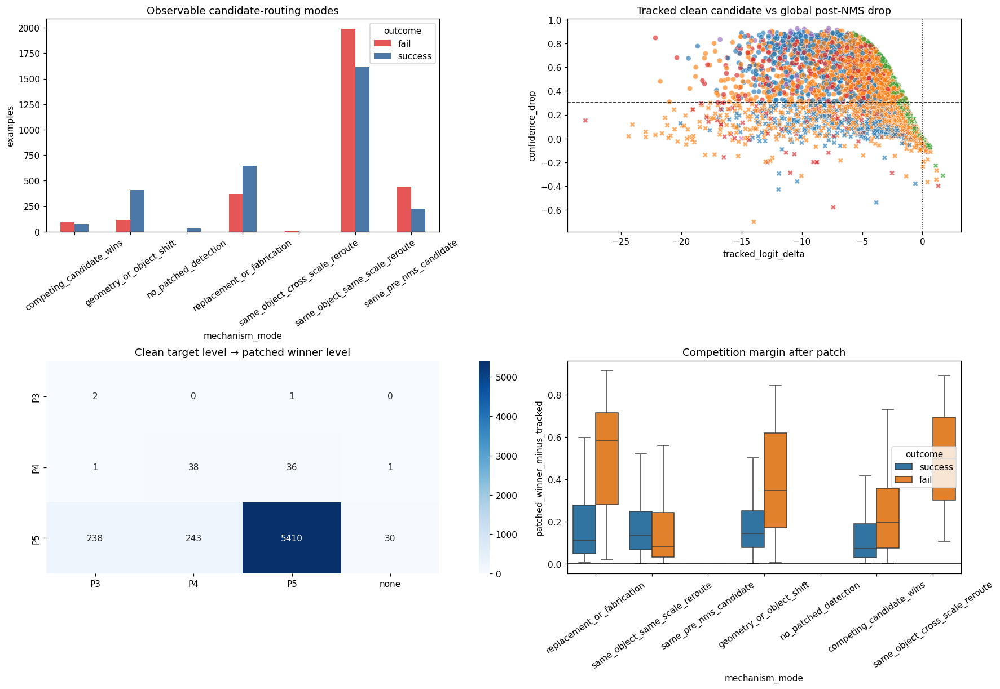

In [6]:
display(pd.crosstab(
    trace_examples.mechanism_mode,
    trace_examples.success.map({0: "fail", 1: "success"}),
    margins=True,
))
display(trace_examples.groupby(["mechanism_mode", "success"]).agg(
    n=("example_id", "size"),
    mean_drop=("confidence_drop", "mean"),
    mean_tracked_logit_delta=("tracked_logit_delta", "mean"),
    tracked_nms_survival=("patched_tracked_nms_survived", "mean"),
    mean_winner_iou_clean=("winner_iou_clean", "mean"),
).round(4))

fig = plot_candidate_overview(trace_examples)
plt.show()

### Глобальные rank-профили

Запрос читает только первые 20 кандидатов каждого примера, а не всю SQLite-таблицу.

,example_id,variant,rank,flat_index,level_index,level_name,y_index,x_index,stride,decoded_score,class_logit,bbox_x1,bbox_y1,bbox_x2,bbox_y2,bbox_area,center_x,center_y,dfl_left,dfl_top,dfl_right,dfl_bottom,nms_max_iou,nms_survived,nms_rank,nms_conf
0,0000f077c16f370b,clean,1,8209,2,P5,10,9,32.0,0.933664,2.644391,50.764099,41.466492,600.360229,596.936218,305284.012257,325.562164,319.201355,7.913622,9.204172,9.261253,8.154258,1.000000,1,0.0,0.933664
1,0000f077c16f370b,clean,2,8210,2,P5,10,10,32.0,0.911870,2.336690,44.855347,41.686646,599.585327,600.243286,309848.114345,322.220337,320.964966,9.098271,9.197291,8.237041,8.257600,0.981744,0,NaN,NaN
2,0000f077c16f370b,clean,3,8211,2,P5,10,11,32.0,0.900892,2.207174,39.795898,41.608887,597.702759,605.970947,314861.465301,318.749329,323.789917,10.256377,9.199723,7.178211,8.436593,0.959909,0,NaN,NaN
3,0000f077c16f370b,clean,4,8229,2,P5,11,9,32.0,0.899366,2.190201,51.093201,35.280090,601.385925,602.058167,311893.851785,326.239563,318.669128,7.903335,10.397499,9.293311,7.314319,0.977648,0,NaN,NaN
4,0000f077c16f370b,clean,5,8231,2,P5,11,11,32.0,0.889925,2.089971,41.326721,39.050415,595.659119,608.317871,315563.393711,318.492920,323.684143,10.208540,10.279673,7.114347,7.509935,0.951278,0,NaN,NaN


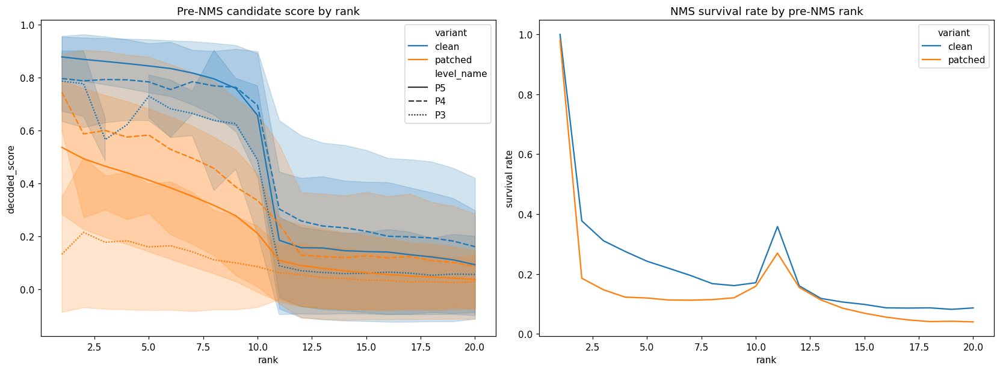

In [7]:
with sqlite3.connect(trace_result.db_path) as conn:
    rank_candidates = pd.read_sql_query(
        "SELECT * FROM candidates WHERE rank <= 20 ORDER BY example_id, variant, rank",
        conn,
    )
display(rank_candidates.head())
fig = plot_candidate_rank_profiles(rank_candidates)
plt.show()

### Разметка отдельных примеров

В каждой строке показаны clean/patched bbox, барчарт истории score, top candidates по уровням и Hungarian lineage. Цвета top-candidate bars: P3 — синий, P4 — оранжевый, P5 — зелёный.

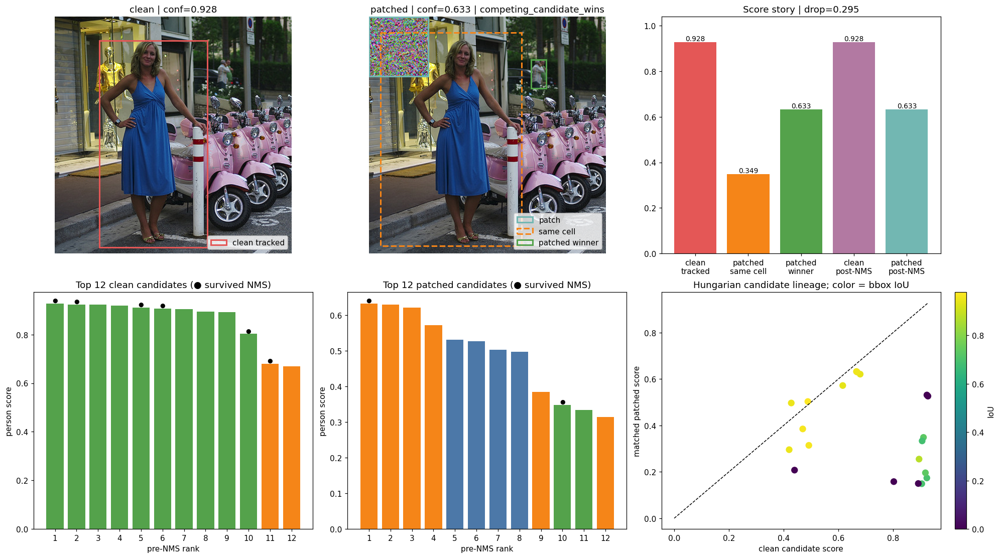

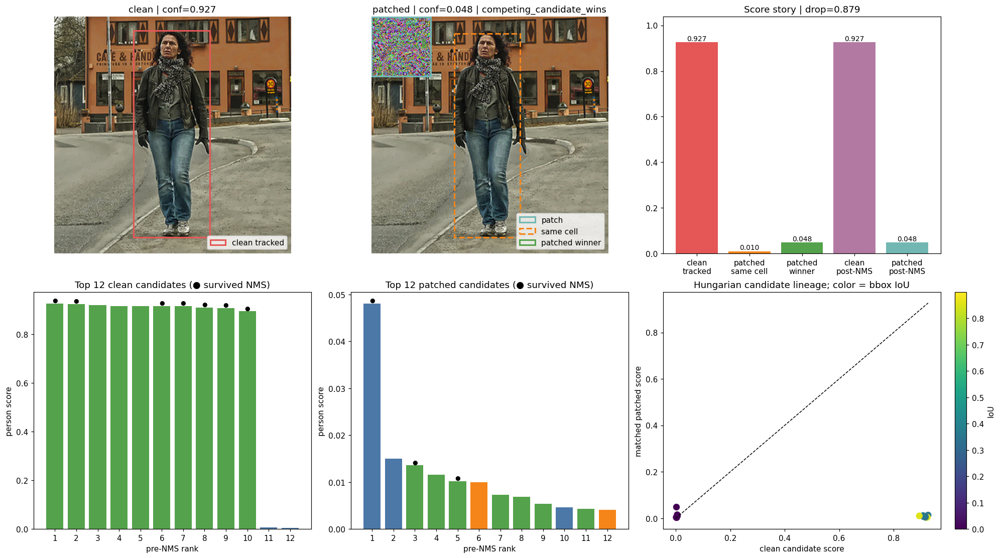

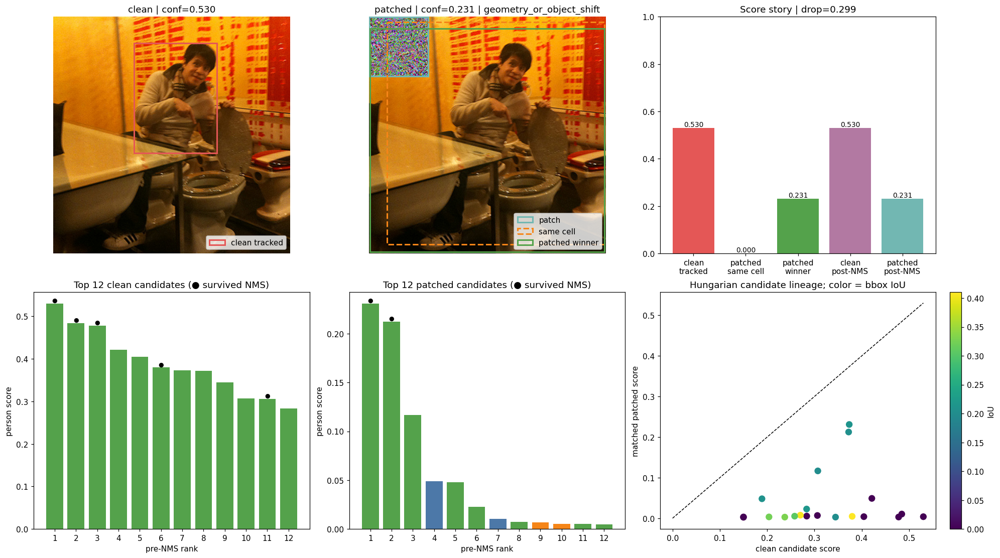

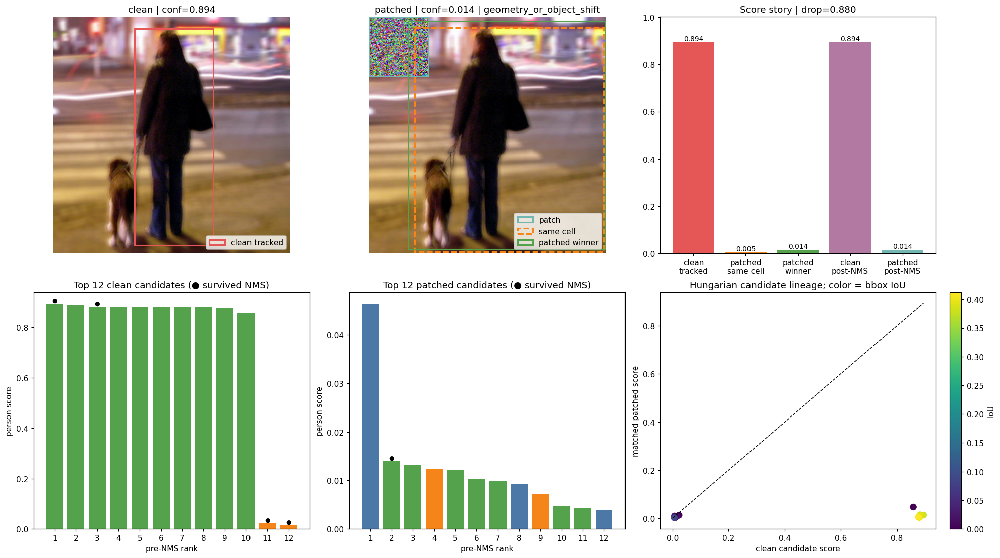

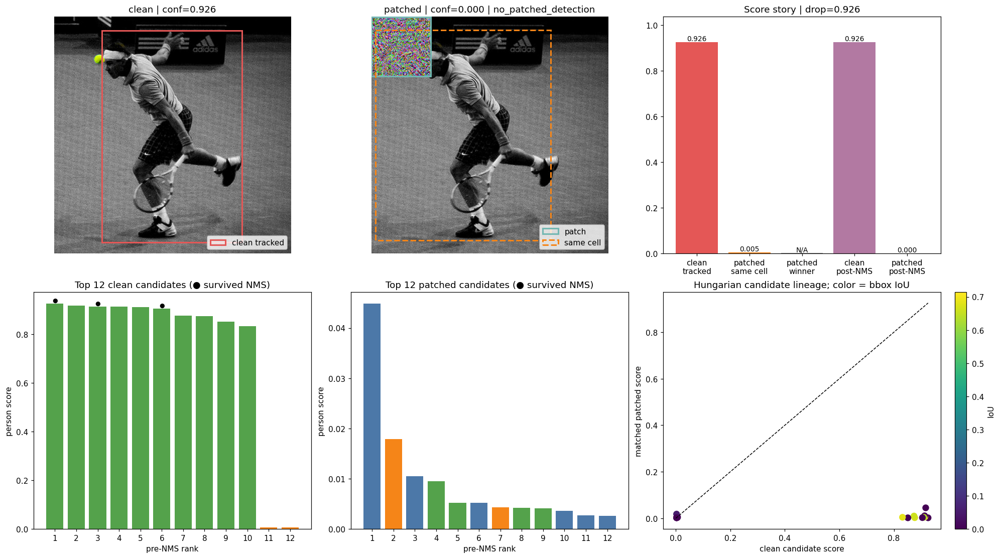

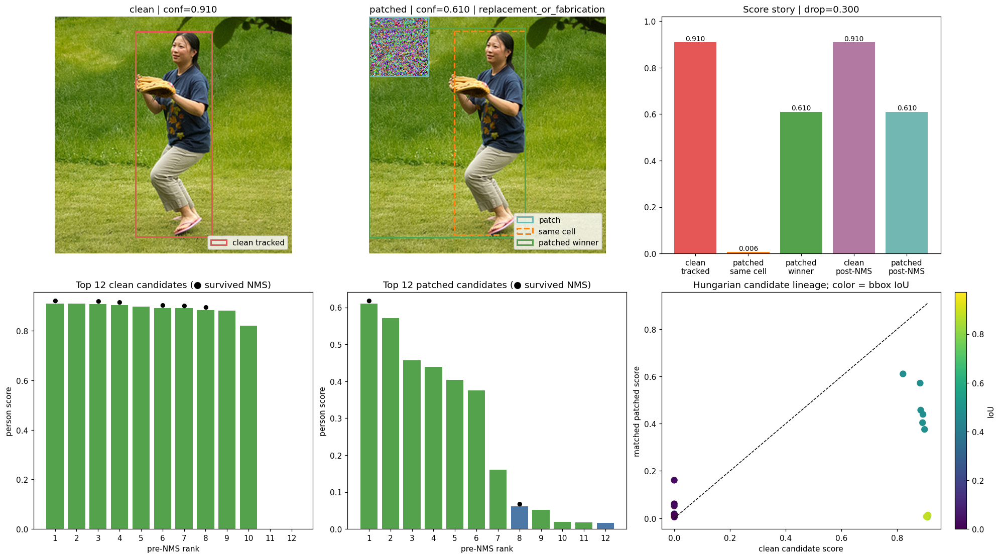

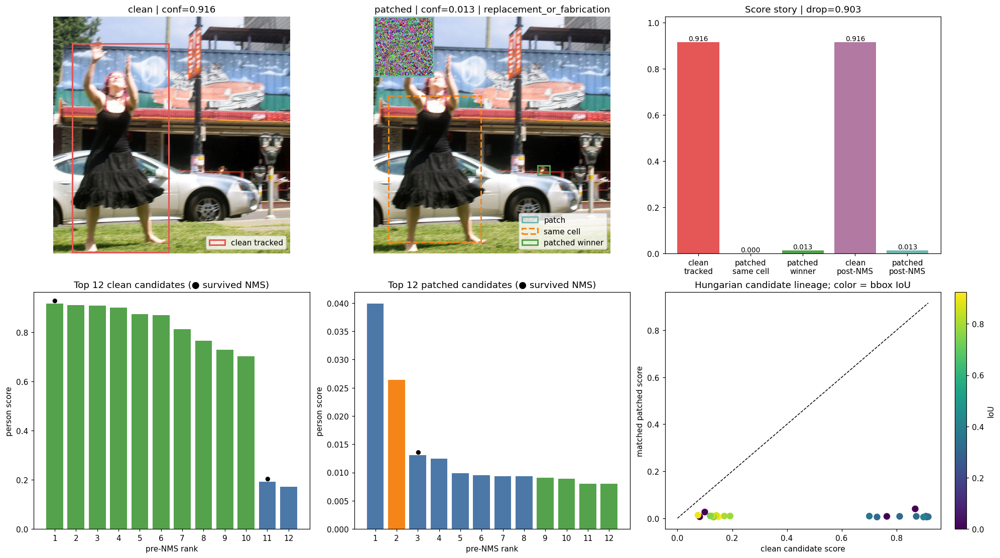

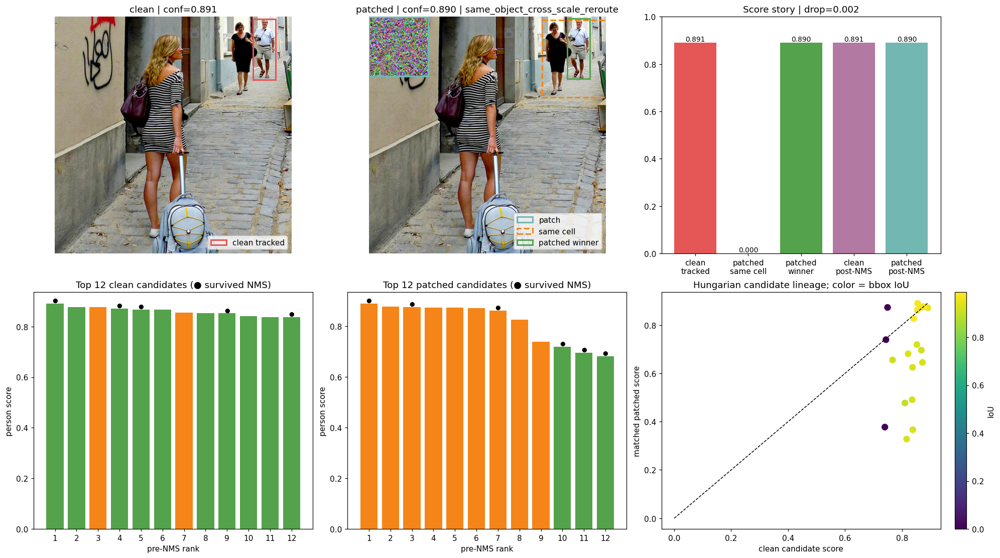

In [8]:
visual_example_ids = select_visual_example_ids(trace_examples, n=min(8, len(trace_examples)))
for example_id in visual_example_ids:
    fig = plot_candidate_example(exp, trace_result, example_id, top_n=12)
    plt.show()

### Интерактивный просмотр любого примера

In [9]:
try:
    import ipywidgets as widgets

    labels = {
        f"{row.mechanism_mode} | success={row.success} | drop={row.confidence_drop:.3f} | {Path(row.path).name}": row.example_id
        for _, row in trace_examples.iterrows()
    }
    dropdown = widgets.Dropdown(options=labels, description="example:", layout=widgets.Layout(width="95%"))
    output = widgets.Output()

    def render(change=None):
        with output:
            output.clear_output(wait=True)
            fig = plot_candidate_example(exp, trace_result, dropdown.value, top_n=15)
            plt.show()

    dropdown.observe(render, names="value")
    display(dropdown, output)
    render()
except ImportError:
    print("ipywidgets unavailable; use plot_candidate_example(...) directly.")

Dropdown(description='example:', layout=Layout(width='95%'), options={'replacement_or_fabrication | success=1 …

Output()

## Stage 2 — signed clean → patched path

Для `tracked_clean` сумма вкладов должна приближать точное изменение class-logit clean-ячейки.

`winner_margin` объясняет изменение фиксированного margin:

```text
score(clean target cell) - score(patched winner cell)
```

Если patched winner совпадает с clean target, margin-вариант пропускается как вырожденный.

In [10]:
path_config = AttackPathConfig(
    output_dir=str(OUTPUT_DIR),
    max_output_gb=DISK_LIMIT_GB,
    max_examples=PATH_MAX_EXAMPLES,
    n_steps=PATH_STEPS,
    alpha_batch_size=PATH_ALPHA_BATCH,
    target_kinds=PATH_TARGET_KINDS,
    top_contributions=PATH_TOP_CONTRIBUTIONS,
    visual_map_examples=PATH_VISUAL_MAP_EXAMPLES,
    progress=True,
)
path_result = run_attack_path_decomposition(exp, trace_result, path_config)
print("run dir:", path_result.run_dir)
print("database:", path_result.db_path)
print(path_result.digest_path.read_text())
print(f"all new outputs: {output_size_gb(OUTPUT_DIR):.4f} GiB")

attack-path decomposition:   0%|          | 0/200 [00:00<?, ?img/s]

run dir: /Users/ashentide/PycharmProjects/PatchSuccessResearch/CandidateRoutingAndAttackPath/outputs/attack_path_5ef23878fe1dfaea
database: /Users/ashentide/PycharmProjects/PatchSuccessResearch/CandidateRoutingAndAttackPath/outputs/attack_path_5ef23878fe1dfaea/attack_path.sqlite
# Attack-path digest

- unique examples: 200
- target rows: 346
- median relative completeness error: 0.000446
- mean |exact delta - clean first-order|: 4.205270
- mean absolute contribution in top 0.1% / 1% / 2%: 0.782 / 0.999 / 1.000

Read summary.json, group_summary.csv, and level_summary.csv before querying SQLite.

all new outputs: 0.2190 GiB


In [11]:
path_tables = load_attack_path_tables(path_result)
path_examples = path_tables["examples"]
path_levels = path_tables["levels"]
display(path_examples.head())

with open(path_result.summary_path, encoding="utf-8") as fh:
    path_summary = json.load(fh)
display(pd.Series(path_summary).to_frame("value"))

display(path_examples.groupby(["target_kind", "success", "mechanism_mode"]).agg(
    n=("example_id", "size"),
    exact_delta=("exact_score_delta", "mean"),
    path_sum=("path_sum", "mean"),
    median_rel_completeness=("relative_completeness_error", "median"),
    mean_abs_first_order_residual=("first_order_residual", lambda x: np.abs(x).mean()),
    top_0p1=("top0p1_abs_fraction", "mean"),
    top_1=("top1_abs_fraction", "mean"),
    top_2=("top2_abs_fraction", "mean"),
).round(4))

median_completeness = float(path_examples.relative_completeness_error.median())
print(f"median relative completeness error: {median_completeness:.6f}")
if median_completeness > 0.02:
    warnings.warn("Path integral is not converged. Increase PATH_STEPS before interpreting contributions.")

,example_id,target_kind,path,success,confidence_drop,mechanism_mode,target_terms_json,score_clean,score_patched,exact_score_delta,path_sum,completeness_error,relative_completeness_error,first_order_sum,first_order_residual,path_minus_first_order,total_abs_contribution,positive_contribution,negative_contribution,top0p1_abs_fraction,top1_abs_fraction,top2_abs_fraction,maps_path,n_steps,error
0,0391cb4397fe42e7,tracked_clean,/Users/ashentide/PycharmProjects/PatchSuccessR...,0,0.052558,competing_candidate_wins,"[{""coefficient"": 1.0, ""level"": 2, ""x"": 9, ""y"":...",2.150553,0.021770,-2.128783,-2.130186,-0.001403,0.000659,-0.881071,-1.247712,-1.249116,11.114467,4.492140,-6.622326,0.795007,1.000000,1.0,/Users/ashentide/PycharmProjects/PatchSuccessR...,16,None
1,0391cb4397fe42e7,winner_margin,/Users/ashentide/PycharmProjects/PatchSuccessR...,0,0.052558,competing_candidate_wins,"[{""coefficient"": 1.0, ""level"": 2, ""x"": 9, ""y"":...",0.408974,-1.660176,-2.069149,-2.070560,-0.001411,0.000682,-0.820657,-1.248492,-1.249903,12.742760,5.336099,-7.406660,0.735418,0.999236,1.0,/Users/ashentide/PycharmProjects/PatchSuccessR...,16,None
2,451b8d3ab7a7d91a,tracked_clean,/Users/ashentide/PycharmProjects/PatchSuccessR...,0,0.217136,geometry_or_object_shift,"[{""coefficient"": 1.0, ""level"": 2, ""x"": 10, ""y""...",1.002417,-6.820702,-7.823118,-7.818922,0.004197,0.000536,-1.222501,-6.600617,-6.596421,45.670101,18.925587,-26.744509,0.796723,1.000000,1.0,/Users/ashentide/PycharmProjects/PatchSuccessR...,16,None
3,451b8d3ab7a7d91a,winner_margin,/Users/ashentide/PycharmProjects/PatchSuccessR...,0,0.217136,geometry_or_object_shift,"[{""coefficient"": 1.0, ""level"": 2, ""x"": 10, ""y""...",2.499195,-6.878303,-9.377498,-9.370746,0.006752,0.000720,-4.836513,-4.540986,-4.534233,66.475143,28.552200,-37.922947,0.735626,0.999175,1.0,/Users/ashentide/PycharmProjects/PatchSuccessR...,16,None
4,4848251204bb9e61,tracked_clean,/Users/ashentide/PycharmProjects/PatchSuccessR...,0,0.130441,replacement_or_fabrication,"[{""coefficient"": 1.0, ""level"": 2, ""x"": 10, ""y""...",1.594871,-0.163791,-1.758662,-1.759286,-0.000625,0.000355,-1.337499,-0.421163,-0.421787,12.328841,5.284776,-7.044063,0.829398,1.000000,1.0,/Users/ashentide/PycharmProjects/PatchSuccessR...,16,None


,value
status,complete
n_target_rows,346
n_examples,200
target_kinds,"{'tracked_clean': 200, 'winner_margin': 146}"
median_relative_completeness_error,0.000446
mean_abs_first_order_residual,4.20527
mean_top_abs_fractions,"{'0.1%': 0.781803732199918, '1%': 0.9993847654..."
database,/Users/ashentide/PycharmProjects/PatchSuccessR...
config,{'output_dir': '/Users/ashentide/PycharmProjec...


n  exact_delta  \
target_kind   success mechanism_mode                                     
tracked_clean 0       competing_candidate_wins         18      -1.6978   
                      geometry_or_object_shift         18      -5.1271   
                      replacement_or_fabrication       18      -5.2390   
                      same_object_cross_scale_reroute   2      -7.6913   
                      same_object_same_scale_reroute   18      -2.3640   
                      same_pre_nms_candidate           18      -0.7432   
              1       competing_candidate_wins         18      -4.6884   
                      geometry_or_object_shift         18      -6.6781   
                      no_patched_detection             18     -10.3643   
                      replacement_or_fabrication       18      -8.6082   
                      same_object_same_scale_reroute   18      -4.0350   
                      same_pre_nms_candidate           18      -2.7662   
winner_margin 0       competing_candidate_wins         18      -2.7874   
                      geometry_or_object_shift         18      -8.2550   
                      replacement_or_fabrication       18      -6.0706   
                      same_object_cross_scale_reroute   2     -11.0501   
                      same_object_same_scale_reroute   18      -2.8401   
              1       competing_candidate_wins         18     -10.0631   
                      geometry_or_object_shift         18     -11.4661   
                      replacement_or_fabrication       18     -15.6166   
                      same_object_same_scale_reroute   18      -6.3568   

                                                       path_sum  \
target_kind   success mechanism_mode                              
tracked_clean 0       competing_candidate_wins          -1.6980   
                      geometry_or_object_shift          -5.1290   
                      replacement_or_fabrication        -5.2374   
                      same_object_cross_scale_reroute   -7.6883   
                      same_object_same_scale_reroute    -2.3589   
                      same_pre_nms_candidate            -0.7431   
              1       competing_candidate_wins          -4.6883   
                      geometry_or_object_shift          -6.6816   
                      no_patched_detection             -10.3702   
                      replacement_or_fabrication        -8.6097   
                      same_object_same_scale_reroute    -4.0315   
                      same_pre_nms_candidate            -2.7661   
winner_margin 0       competing_candidate_wins          -2.7864   
                      geometry_or_object_shift          -8.2583   
                      replacement_or_fabrication        -6.0693   
                      same_object_cross_scale_reroute  -11.0356   
                      same_object_same_scale_reroute    -2.8353   
              1       competing_candidate_wins         -10.0665   
                      geometry_or_object_shift         -11.4722   
                      replacement_or_fabrication       -15.6228   
                      same_object_same_scale_reroute    -6.3522   

                                                       median_rel_completeness  \
target_kind   success mechanism_mode                                             
tracked_clean 0       competing_candidate_wins                          0.0004   
                      geometry_or_object_shift                          0.0005   
                      replacement_or_fabrication                        0.0005   
                      same_object_cross_scale_reroute                   0.0002   
                      same_object_same_scale_reroute                    0.0005   
                      same_pre_nms_candidate                            0.0003   
              1       competing_candidate_wins                          0.0002   
                      geometry_or_object_shift                          0

median relative completeness error: 0.000446


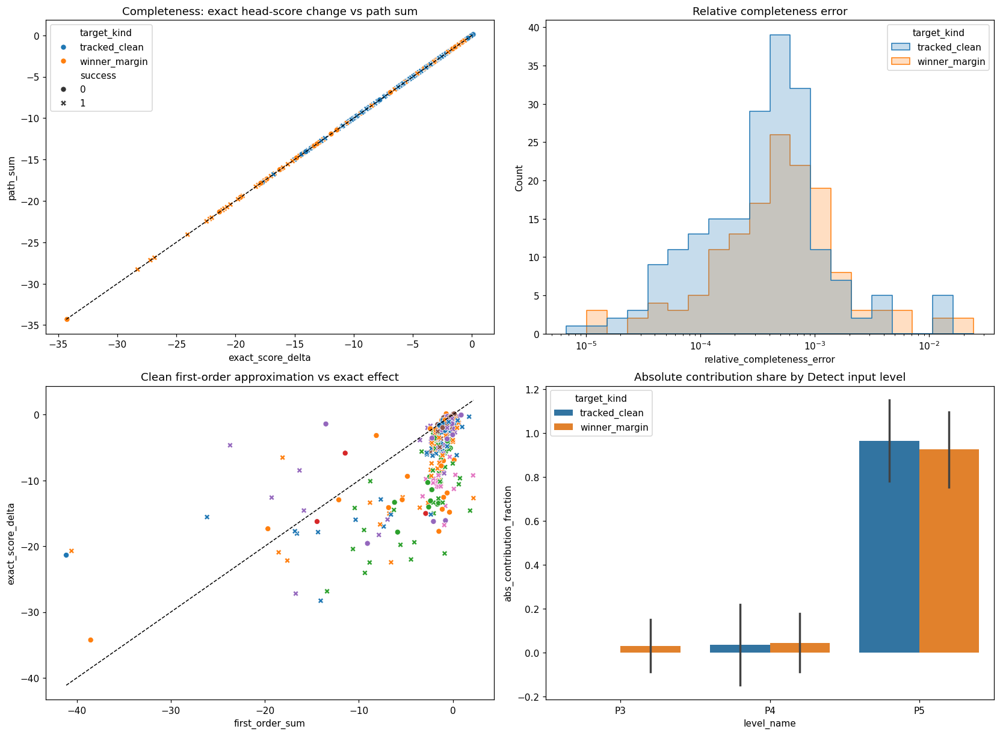

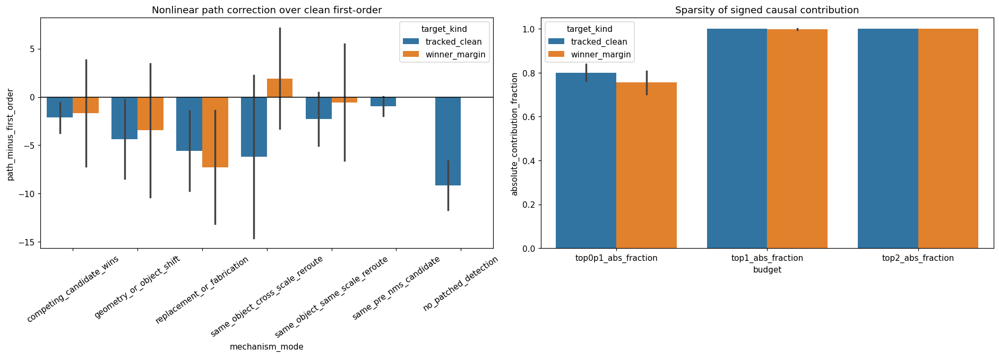

In [12]:
fig = plot_attack_path_overview(path_examples, path_levels)
plt.show()

fig = plot_attack_path_by_mode(path_examples)
plt.show()

### Пространственные карты path contribution

Показываются signed и absolute карты P3/P4/P5, score bar chart и cumulative mass top-neurons.

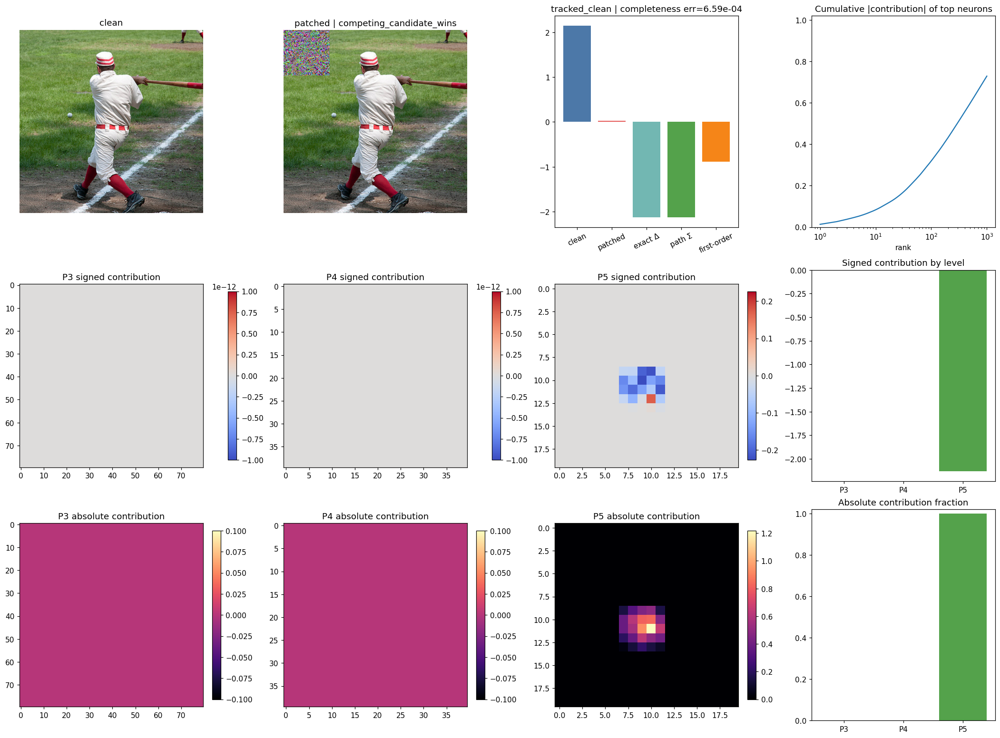

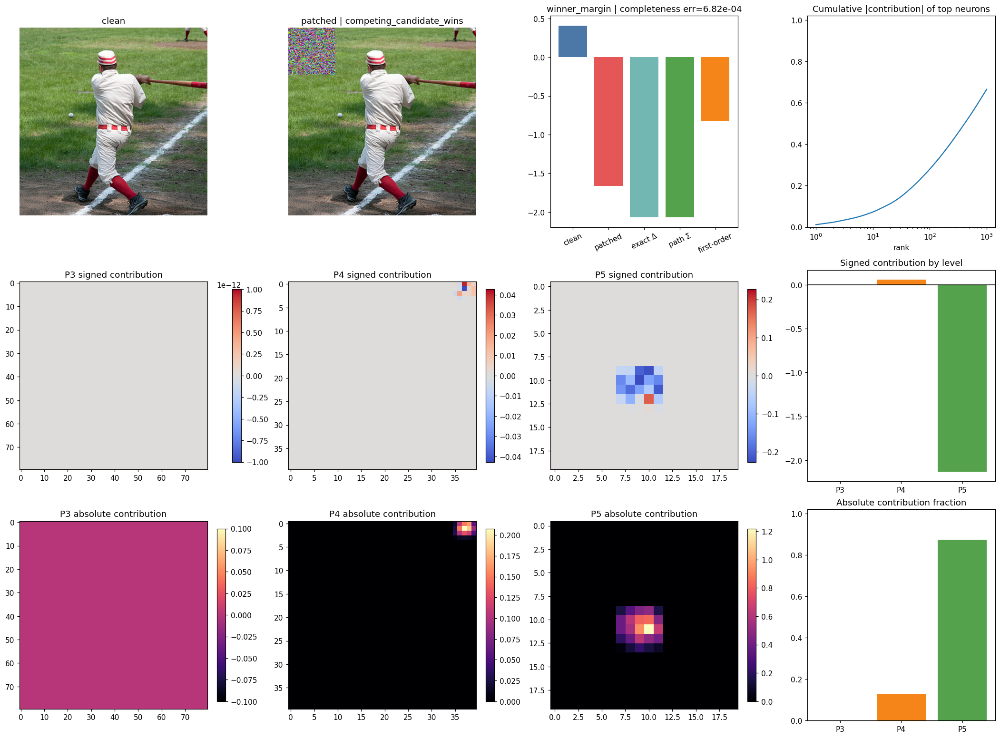

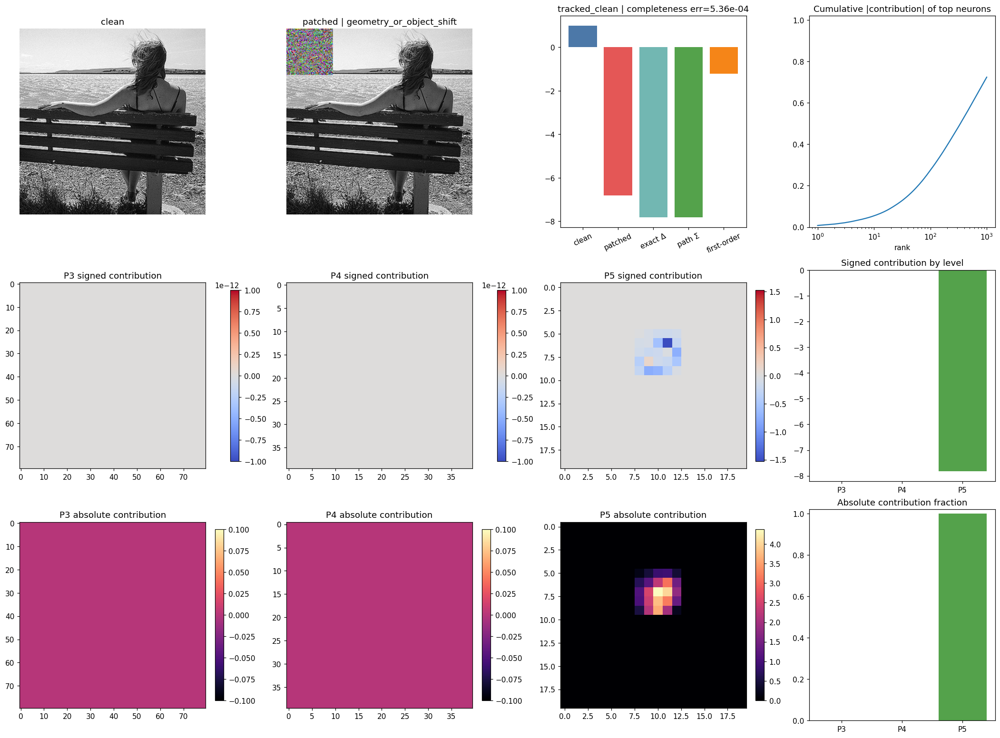

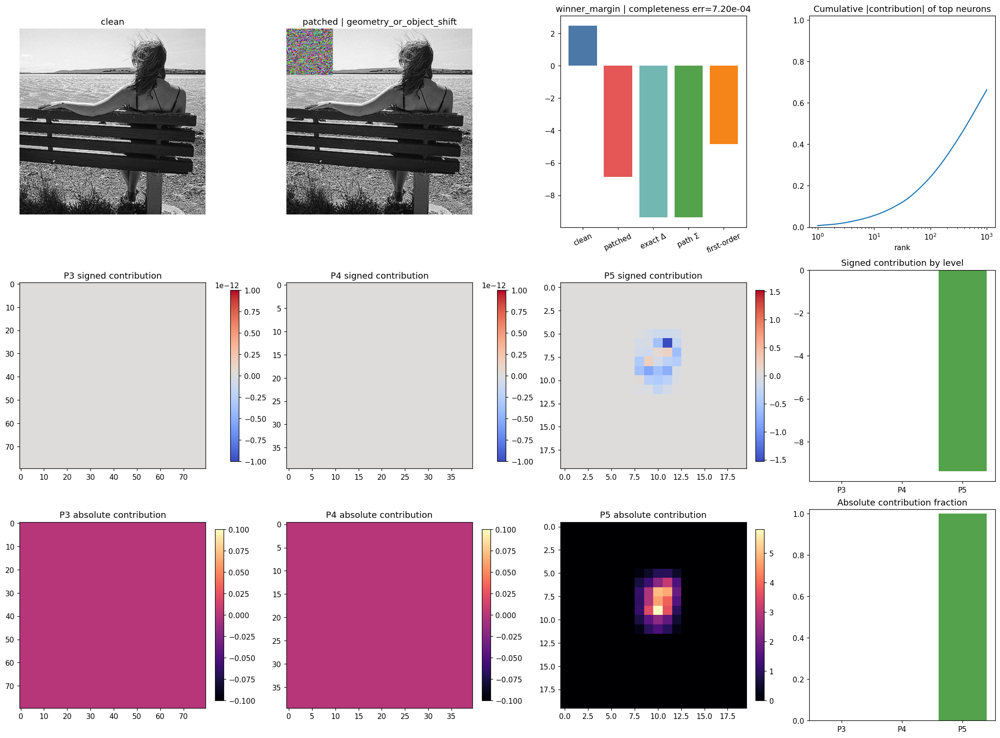

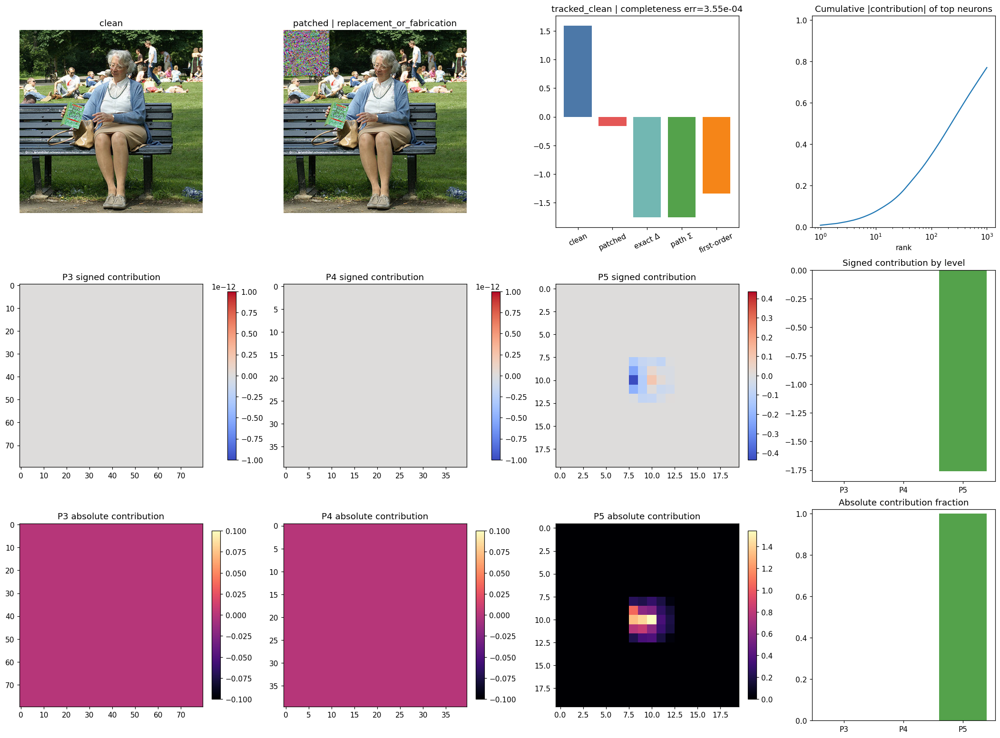

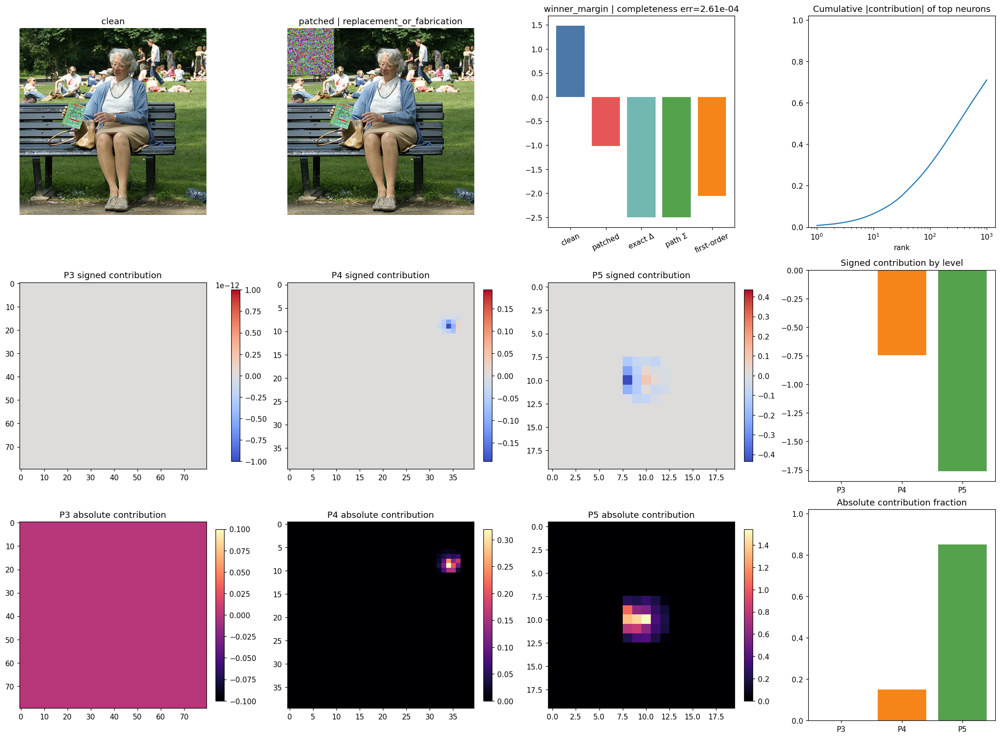

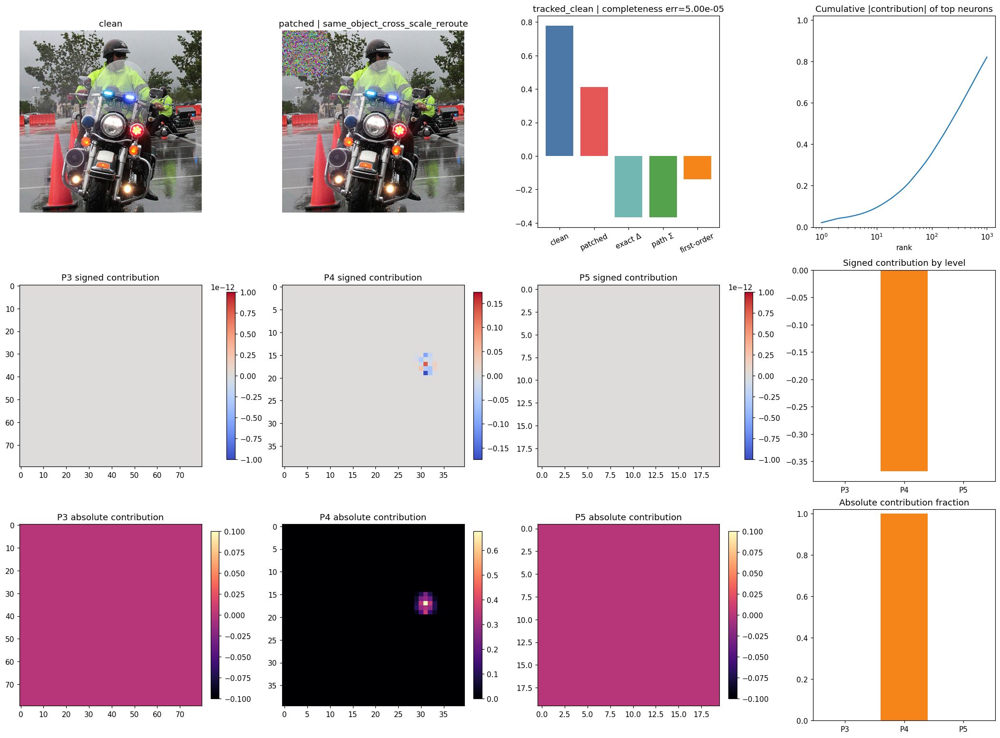

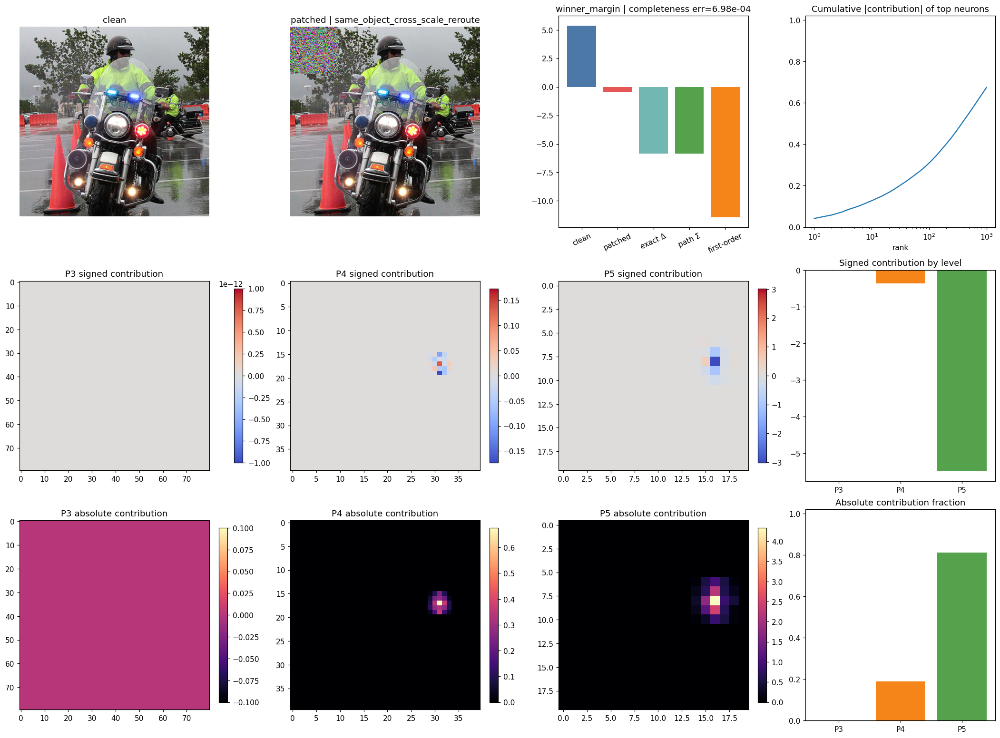

In [13]:
visual_path_rows = path_examples[path_examples.maps_path.notna()].head(8)
for _, row in visual_path_rows.iterrows():
    fig = plot_attack_path_example(
        exp,
        path_result,
        str(row.example_id),
        target_kind=str(row.target_kind),
    )
    plt.show()

### Интерактивный просмотр path-примеров

In [14]:
try:
    import ipywidgets as widgets

    available = path_examples[path_examples.maps_path.notna()].copy()
    labels = {
        f"{row.target_kind} | {row.mechanism_mode} | success={row.success} | exact Δ={row.exact_score_delta:.3f}": (row.example_id, row.target_kind)
        for _, row in available.iterrows()
    }
    dropdown = widgets.Dropdown(options=labels, description="path:", layout=widgets.Layout(width="95%"))
    output = widgets.Output()

    def render_path(change=None):
        with output:
            output.clear_output(wait=True)
            example_id, target_kind = dropdown.value
            fig = plot_attack_path_example(exp, path_result, example_id, target_kind=target_kind)
            plt.show()

    dropdown.observe(render_path, names="value")
    display(dropdown, output)
    if labels:
        render_path()
except ImportError:
    print("ipywidgets unavailable.")

Dropdown(description='path:', layout=Layout(width='95%'), options={'tracked_clean | competing_candidate_wins |…

Output()

## Компактные файлы для следующего анализа

Эти файлы нужно смотреть первыми: они минимизируют чтение больших таблиц и расход токенов.

In [ ]:
artifacts = [
    trace_result.summary_path,
    trace_result.digest_path,
    trace_result.run_dir / "mode_summary.csv",
    trace_result.run_dir / "level_transition_summary.csv",
    trace_result.run_dir / "score_summary.csv",
    path_result.summary_path,
    path_result.digest_path,
    path_result.run_dir / "group_summary.csv",
    path_result.run_dir / "level_summary.csv",
]
display(pd.DataFrame({
    "path": [str(path) for path in artifacts],
    "size_KiB": [path.stat().st_size / 1024 if path.exists() else np.nan for path in artifacts],
}))
print("\n--- candidate digest ---\n")
print(trace_result.digest_path.read_text())
print("\n--- attack-path digest ---\n")
print(path_result.digest_path.read_text())
print(f"\nTotal new output size: {output_size_gb(OUTPUT_DIR):.4f} GiB / {DISK_LIMIT_GB:.1f} GiB")

,path,size_KiB
0,/Users/ashentide/PycharmProjects/PatchSuccessR...,1.686523
1,/Users/ashentide/PycharmProjects/PatchSuccessR...,0.609375
2,/Users/ashentide/PycharmProjects/PatchSuccessR...,0.632812
3,/Users/ashentide/PycharmProjects/PatchSuccessR...,0.205078
4,/Users/ashentide/PycharmProjects/PatchSuccessR...,1.430664
5,/Users/ashentide/PycharmProjects/PatchSuccessR...,0.959961
6,/Users/ashentide/PycharmProjects/PatchSuccessR...,0.313477
7,/Users/ashentide/PycharmProjects/PatchSuccessR...,3.922852
8,/Users/ashentide/PycharmProjects/PatchSuccessR...,5.590820



--- candidate digest ---

# Candidate tracing digest

- examples: 6000 (3000 success, 3000 fail)
- winner changed: 0.889
- cross-scale winner change: 0.086
- tracked candidate survives patched NMS: 0.184
- clean target survives clean NMS: 1.000
- mean clean target/post-NMS score error: 0.000000
- mean cached/recomputed confidence error: clean=0.000000, patched=0.000001

## Most common observable modes

- same_object_same_scale_reroute: 3601
- replacement_or_fabrication: 1014
- same_pre_nms_candidate: 667
- geometry_or_object_shift: 521
- competing_candidate_wins: 164

Read summary.json and the three small CSV summaries before opening SQLite.


--- attack-path digest ---

# Attack-path digest

- unique examples: 200
- target rows: 346
- median relative completeness error: 0.000446
- mean |exact delta - clean first-order|: 4.205270
- mean absolute contribution in top 0.1% / 1% / 2%: 0.782 / 0.999 / 1.000

Read summary.json, group_summary.csv, and level_summary.csv before querying SQLite

: 

## Перед полным запуском

Увеличивайте масштаб только если:

- cached и recomputed confidence отличаются не более чем примерно на `1e-3`;
- median relative completeness error меньше `0.02`;
- визуальные bbox и candidate lineage выглядят корректно;
- `output_size_gb(OUTPUT_DIR)` далеко от лимита.

Рекомендуемый следующий запуск:

```python
TRACE_MAX_EXAMPLES = None
TRACE_BATCH_SIZE = 8       # уменьшить до 2–4 при OOM
PATH_MAX_EXAMPLES = 200
PATH_STEPS = 32            # если 16 шагов не дают completeness < 2%
PATH_VISUAL_MAP_EXAMPLES = 40
```

Не увеличивайте `PATH_TOP_CONTRIBUTIONS` без необходимости: пространственные карты уже хранят распределение вклада, а top-table нужна прежде всего для идентификации конкретных нейронов.